# Training an NMT with Attention

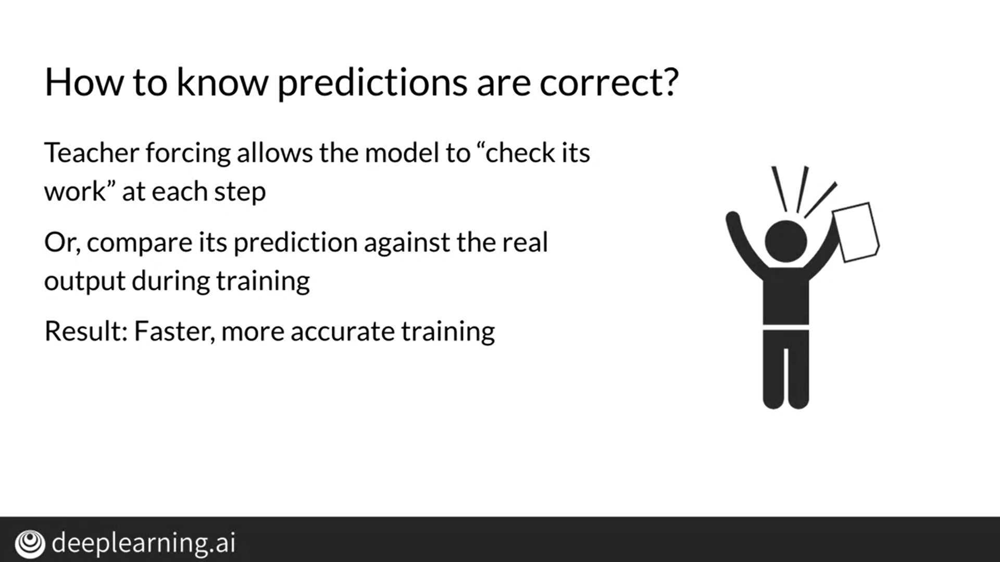

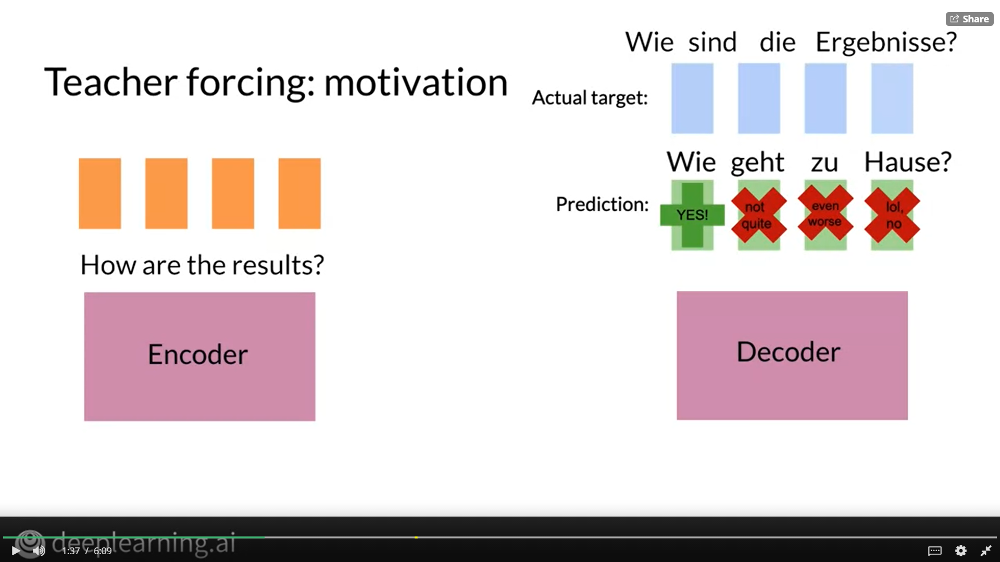

The third one is even further off. The fourth predicted token is quite far from making logical sense in German. The important takeaway here, is that in a sequence model like this one, each wrong prediction makes the following predictions even less likely to be correct. You need to have a way to check the prediction made at each step.

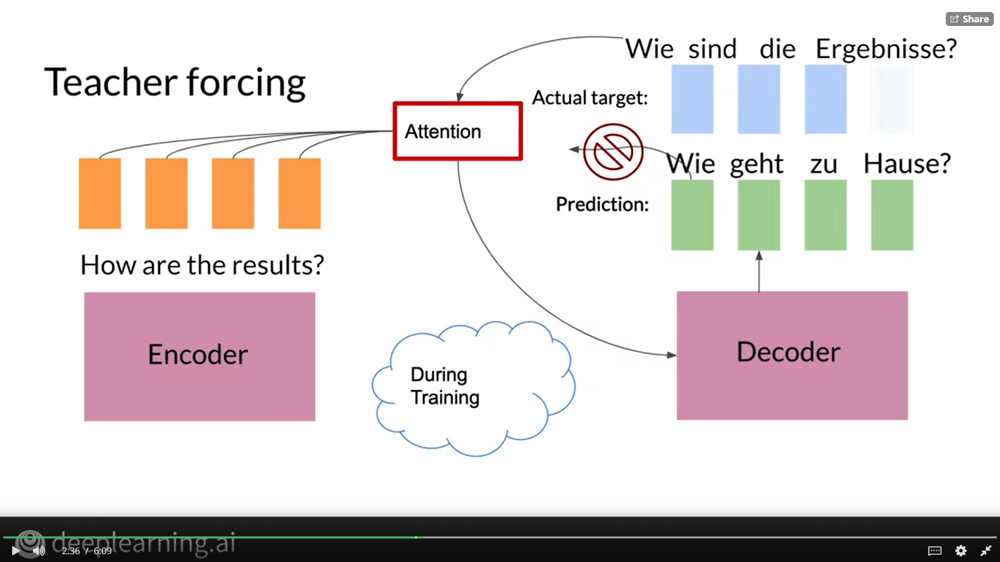

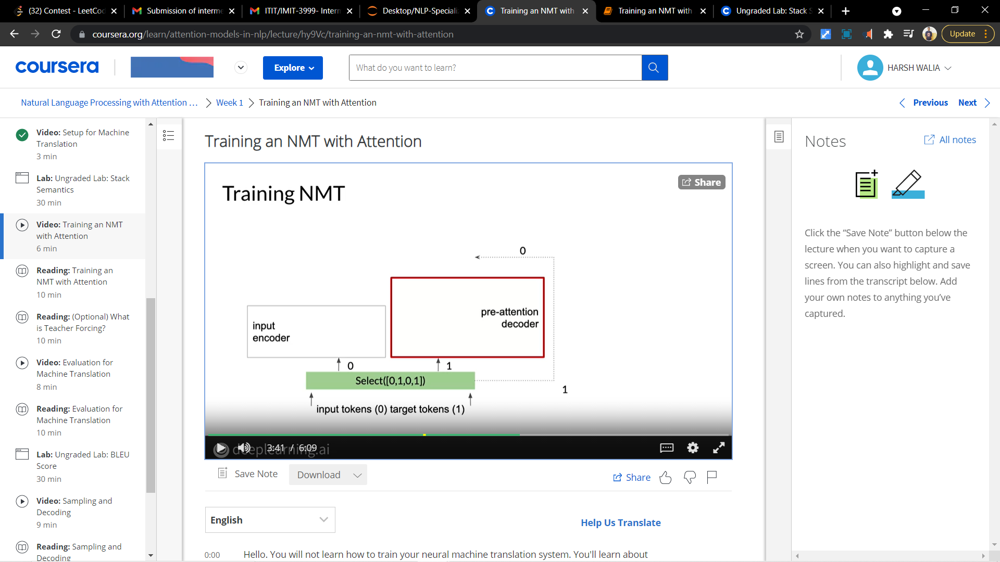

* The initial select makes two copies. Each of the input tokens represented by zero and the target tokens represented by one. Remember that here the input is English tokens, and the target is German tokens.
* One copy of the input tokens are fed into the inputs encoder to be transformed into the key and value vectors. While a copy of the target tokens goes into the pre-attention decoder. `Important note here, the pre-attention decoder is not the decoder you were shown earlier, which produces the decoded outputs. `
* The pre-attention decoder is transforming the prediction targets into a different vector space called the query vector. That's going to calculate the relative weights to give each input weight. 

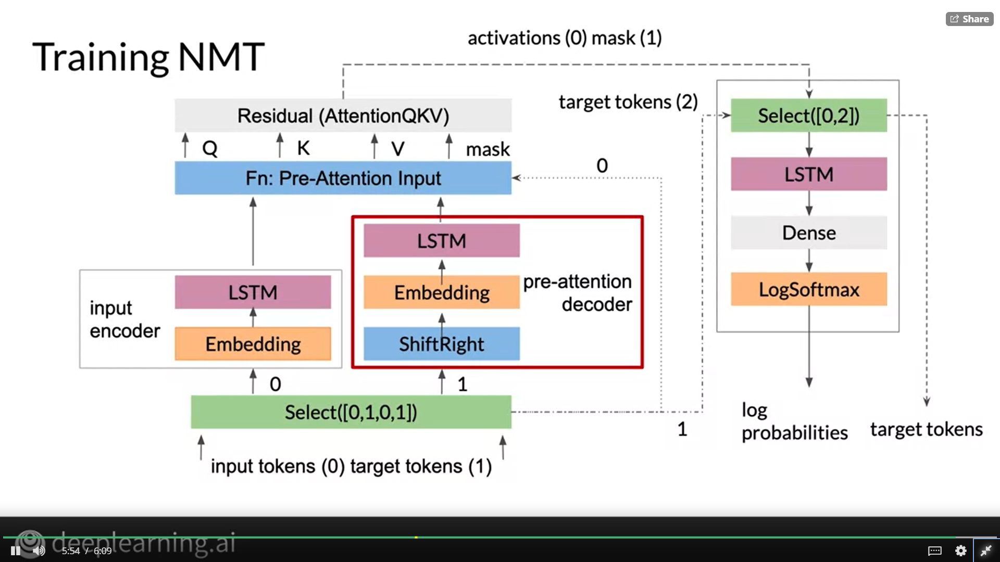

* The pre-attention decoder takes the target tokens and shifts them one place to the right. This is where the teacher forcing takes place. Every token will be shifted one place to the right, and in start of a sentence token, will be a sign to the beginning of each sequence.
* Next, the inputs and targets are converted to embeddings or initial representations of the words. Now that you have your query key and value vectors, you can prepare them for the attention layer. You will also apply a padding mask to help determine the padding tokens. 
* The mask is used after the computation of the Q, K transpose. This before computing the softmax, the where operator in your programming assignment will convert the zero-padding tokens to negative one billion, which will become approximately zero when computing the softmax. That's how padding works. 
* Now, everything is ready for the attention, inside where all the calculations that assign weights happen. The residual block adds the queries generated in the pre-attention decoder to the results of the attention layer. The attention layer then outputs its activations along with the mask that was created earlier. It's time to drop the mask before running everything through the decoder, which is what the second Select is doing.
* It takes the activations from the attention layer or the zero, and the second copy of the target tokens, or the two. Would you remember from way back at the beginning. These are the true targets which the decoder needs to compare against the predictions. Almost done. Then run everything through a dense layer or a simple linear layer with your targets vocab size.
* This gives your output the right size. Finally, you will take the outputs and run it through LogSoftmax, which is what transforms the attention weights to a distribution between zero and one. Those last four steps comprise your decoder. The true target tokens are still hanging out here, and we'll pass down along with the log probabilities to be matched against the predictions. There you have it, the model that you will be building, and the intuition behind the steps. 

# Evaluation for Machine Translation

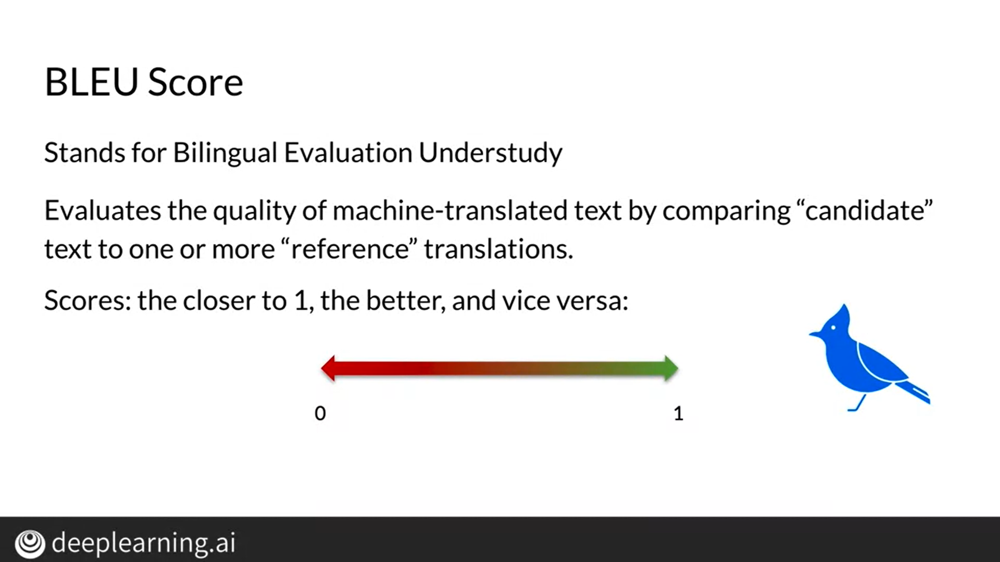

To get a BLEU score, the candidates and the references are usually based on an average of uni, bi, try or even four-gram precision. To demonstrate, I'll use uni-grams as an example. 

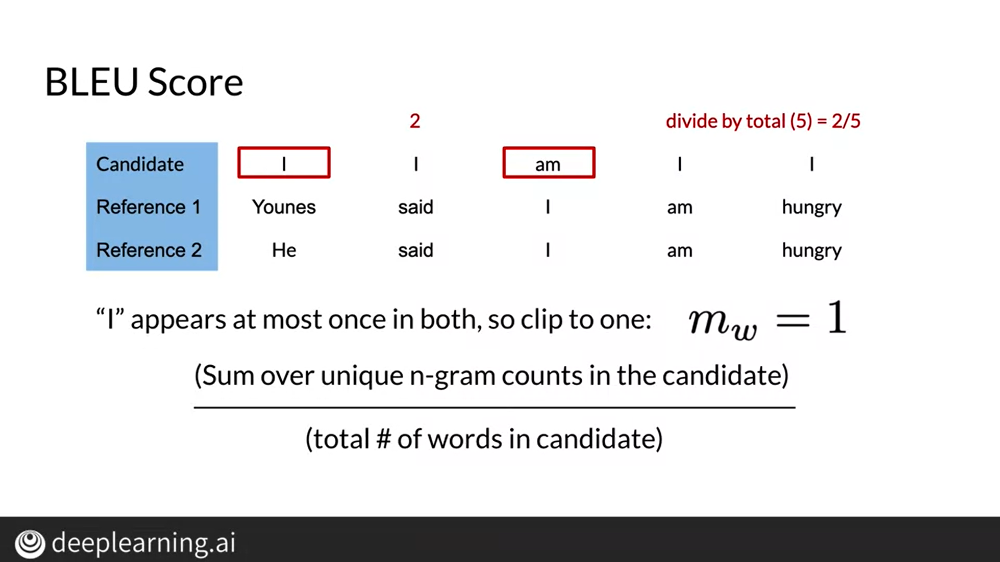

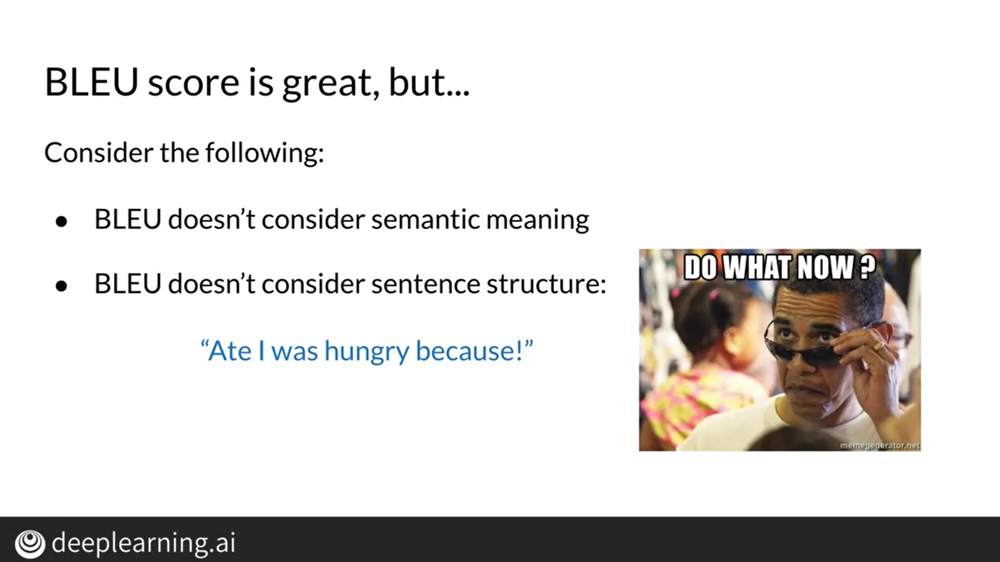

 It works by comparing the machine texts or system texts against the reference texts, which is often created by a human. The ROUGE score calculates precision, and recall for a machine texts by counting the n-gram overlap between the machine texts and a reference texts. Recall that's an` n-gram, is a list of words that appear next to each other in a sentence where the order matters.` If you have the word, "I baked a pie," a uni-gram can be the word baked, and then bi-gram can be the two words a pie.

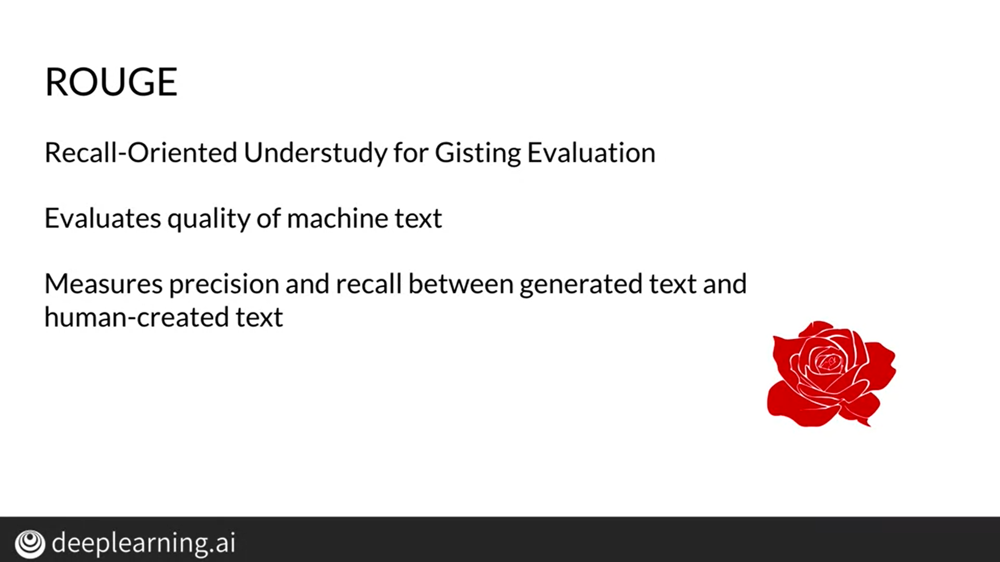

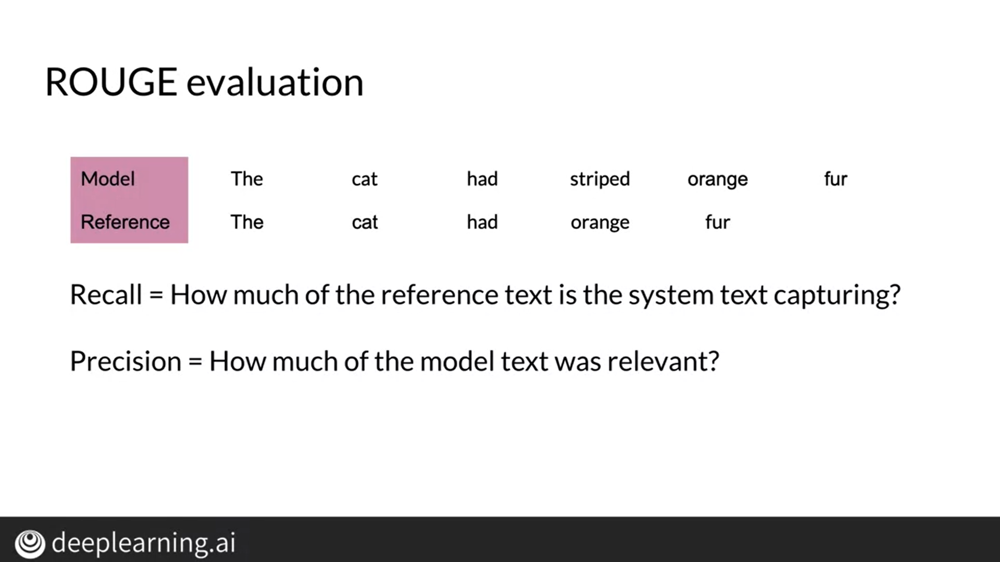

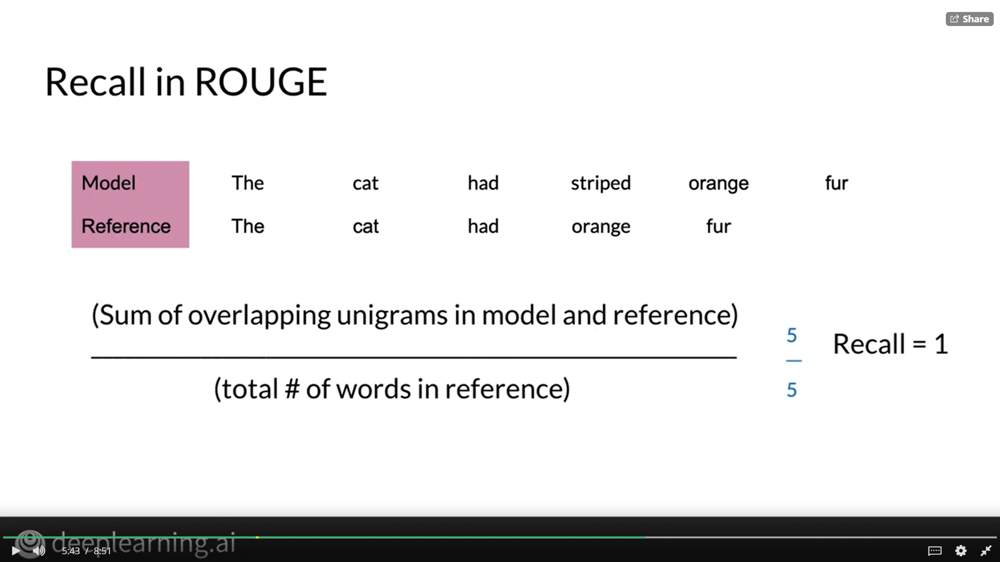

* You can see that there are a total of five overlapping uni-grams and five total words in the reference. This would give you a recall of one, a high score. 
* If your model wanted to have a high recall score, it could just guess hundreds of thousands of words, and it would have a good chance of guessing all the words in the true reference sentence. 
* But what does that actually tell you? This is where precision comes in. To calculate precision, look at all the words that are predicted by your model.

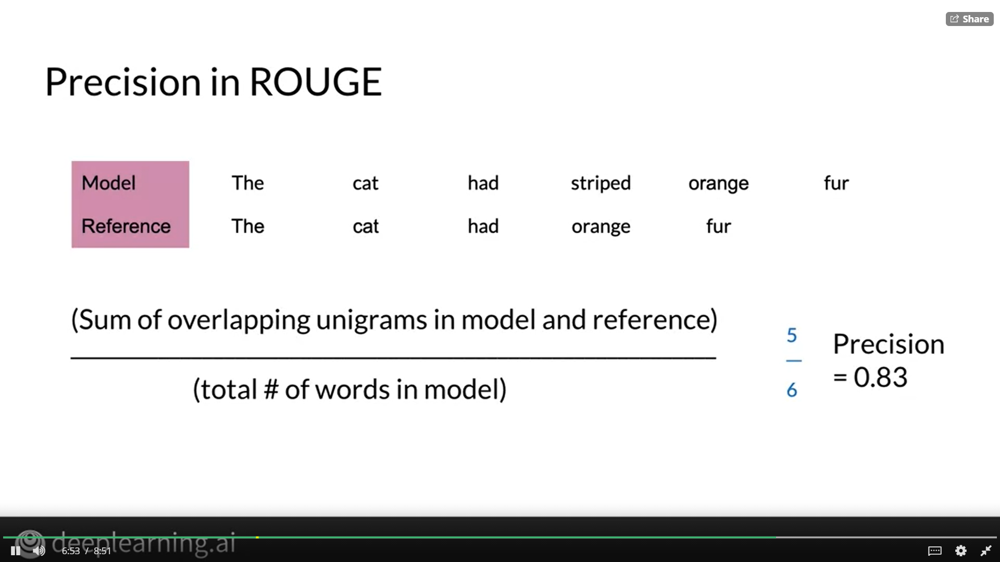

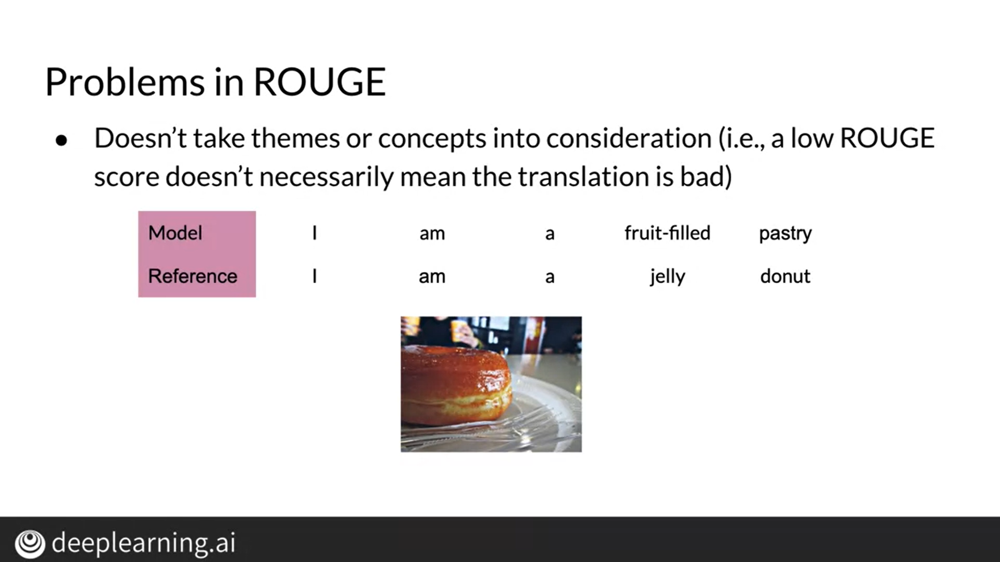

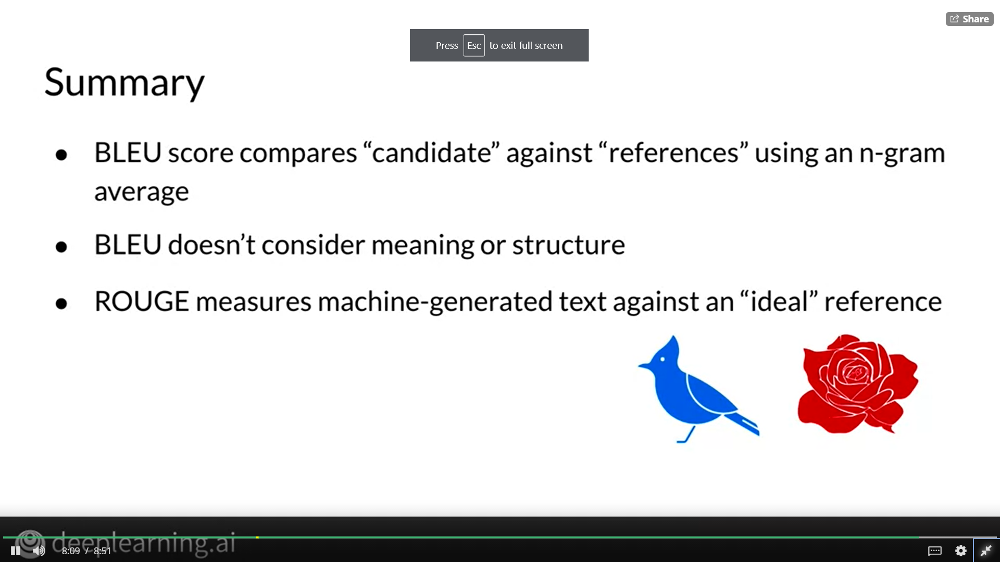

# Sampling and Decoding

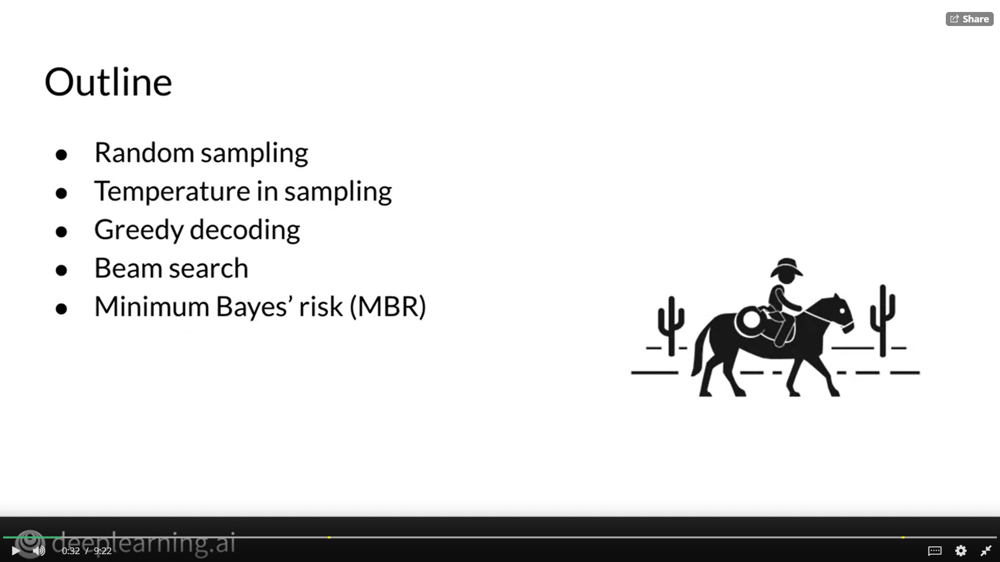

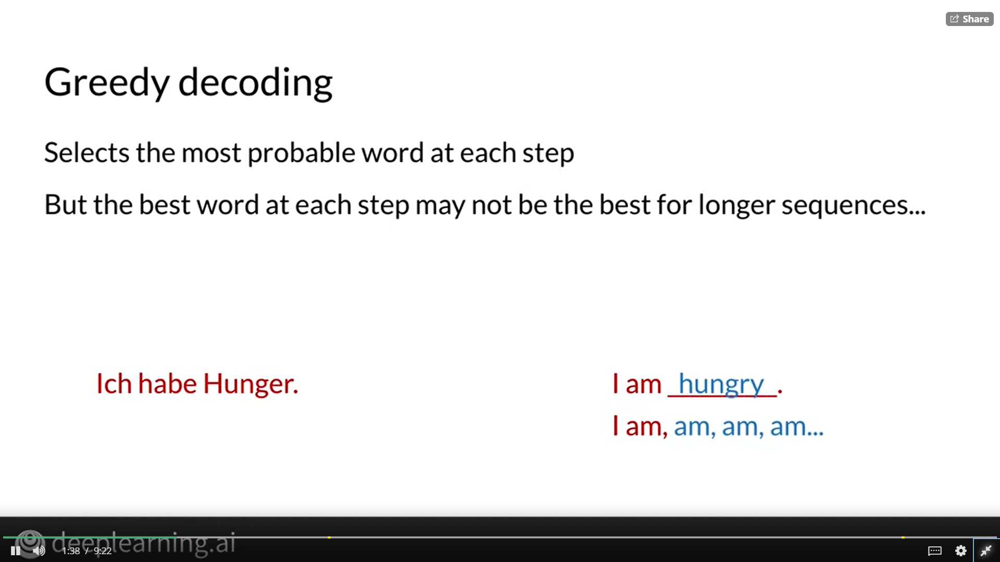

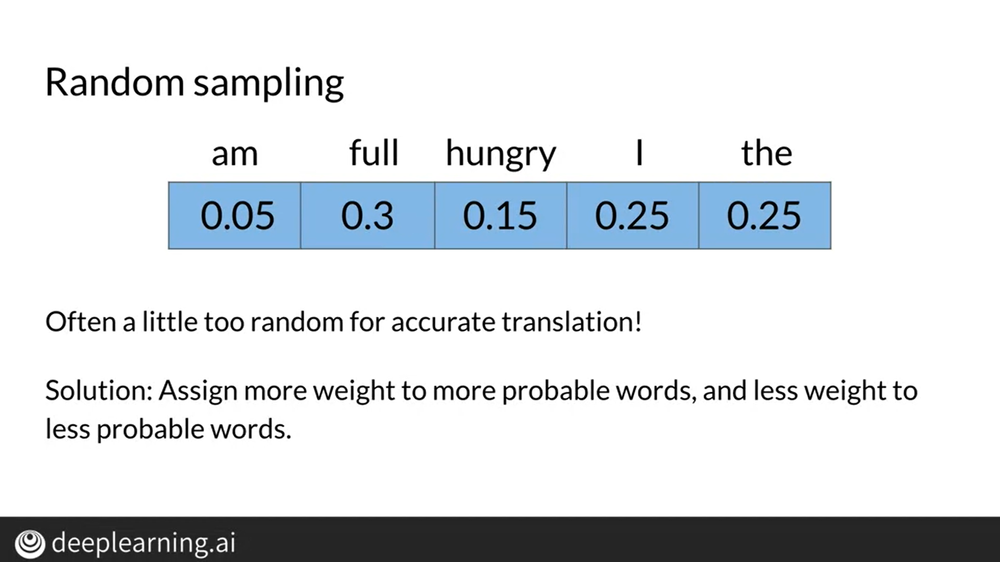

What random sampling does is provide probabilities for each word, and sample accordingly for the next outputs. One of the problems with this is that it could be a little bit too random. A solution for this is to assign more weight to the words with higher probability, and less weight to the others.

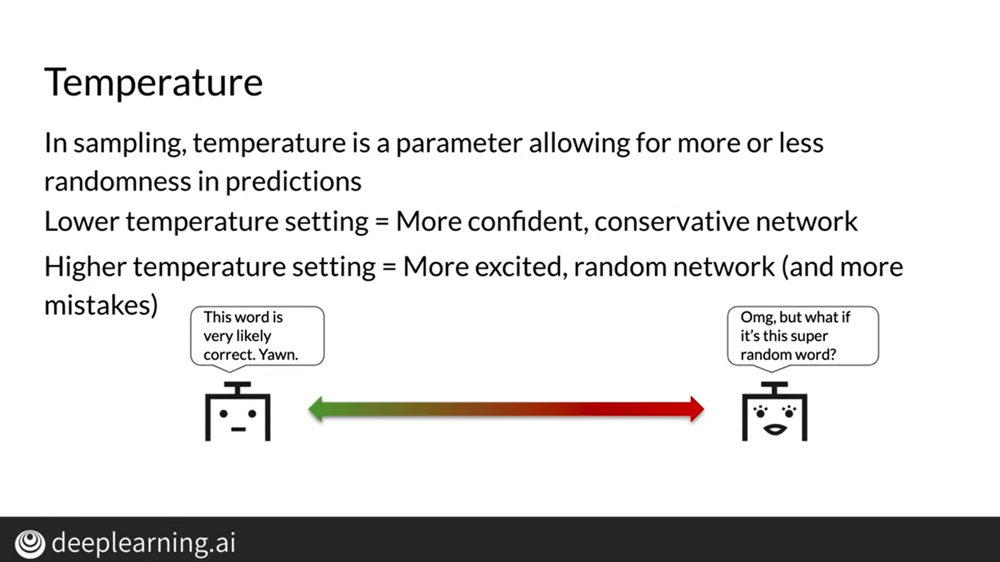

* The model has already encoded the input sequence, and use the previous time steps translation to calculate how much attention to give each of the input words. Now it's using the decoder to predict the next translated word.
* Now choosing just one best candidate might be suitable for the current time step but when we construct the full sentence, it's maybe a sub-optimal choice. Beam search decoding is a more exploratory alternative for decoding that uses a type of restricted breadth-first search to build a search stream. 
* Instead of offering a single best output like in greedy decoding, beam search selects multiple options based on conditional probability. 

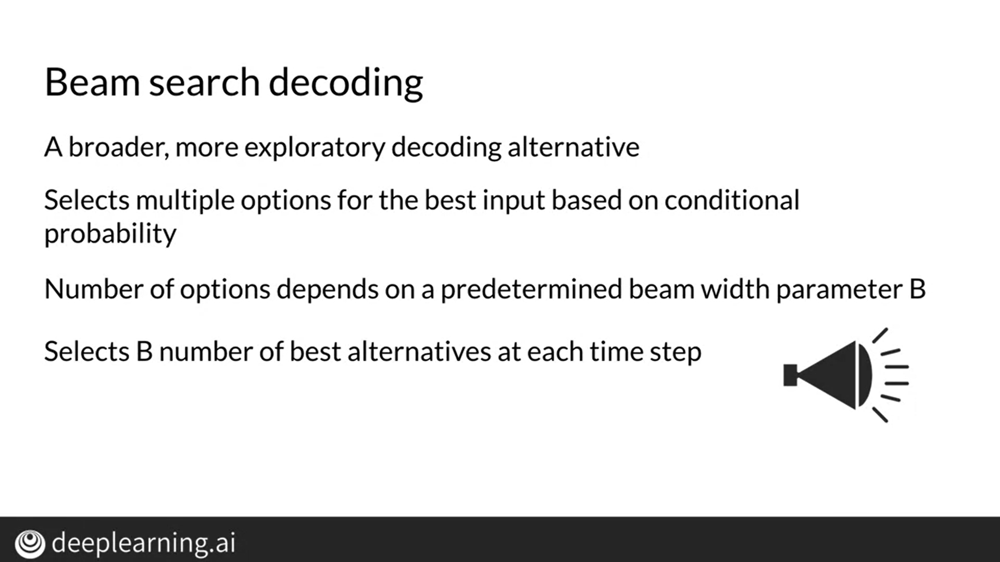

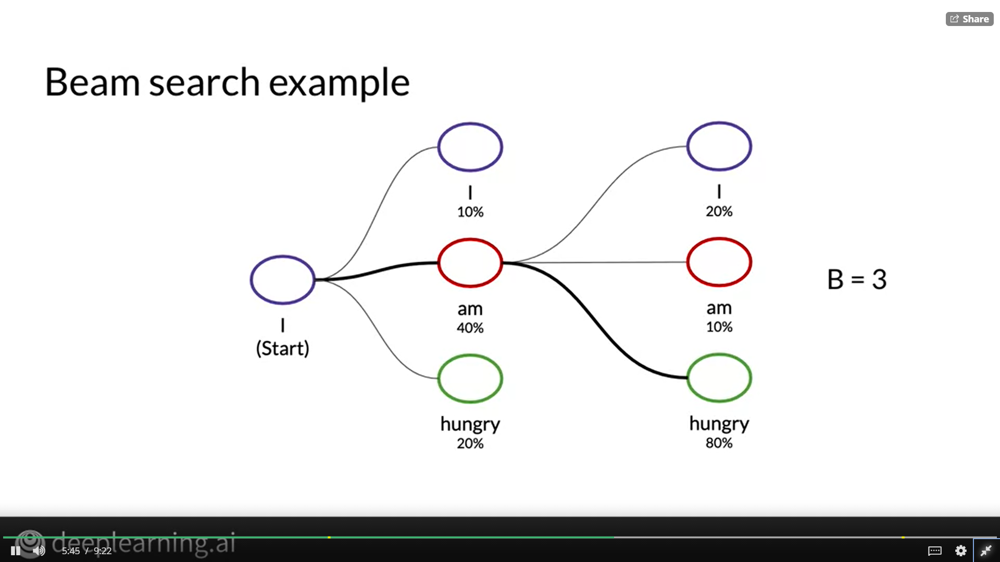

 Earlier you encountered random sampling as a way to choose a probable token, and the issues with that very simple implementation. But if you go a little further with that, say, by generating 30 samples, and comparing them all against one another to see which one performs the best, you'll see quite a bit of improvement in your decoding. This is called Minimum Bayes Risk decoding or MBR for short.

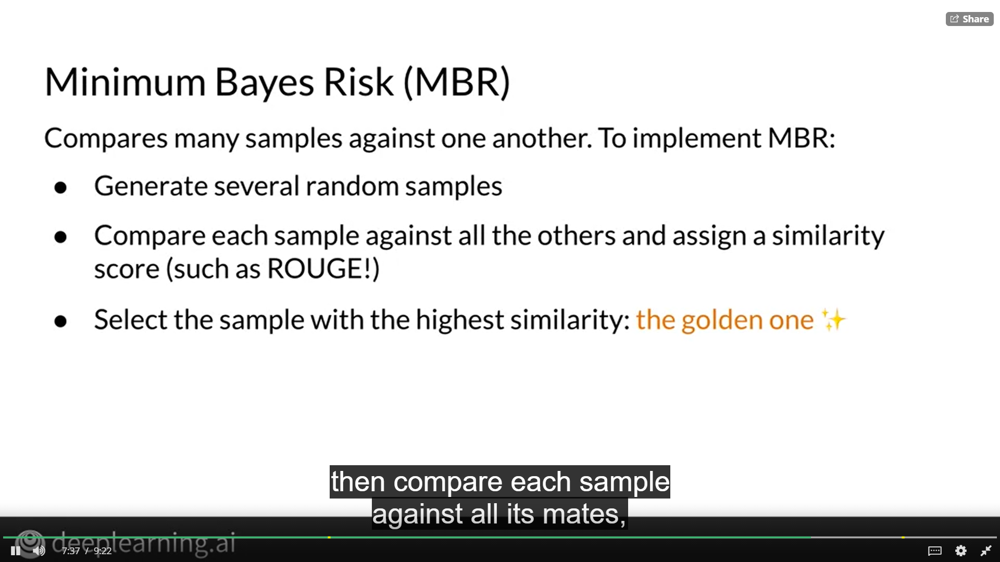

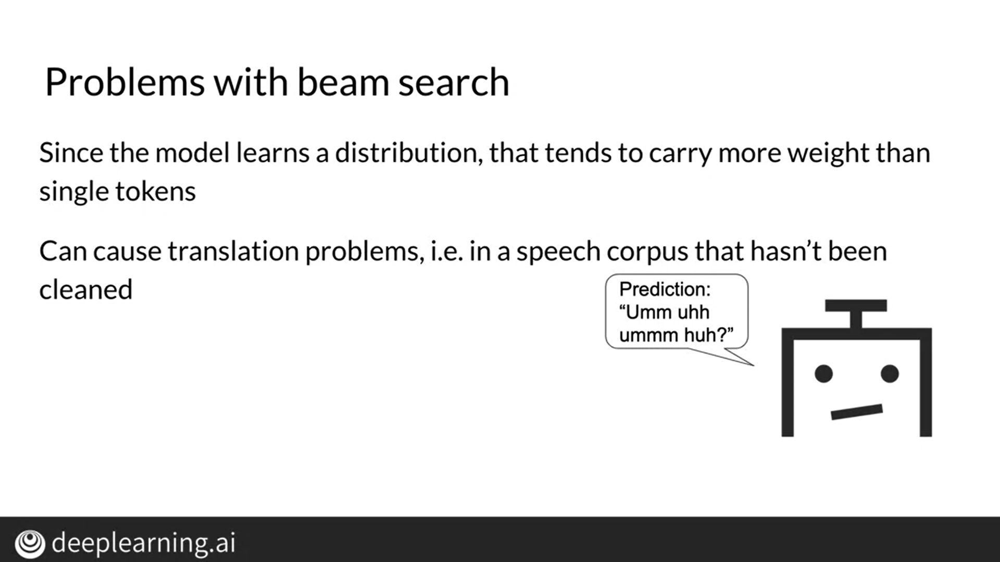

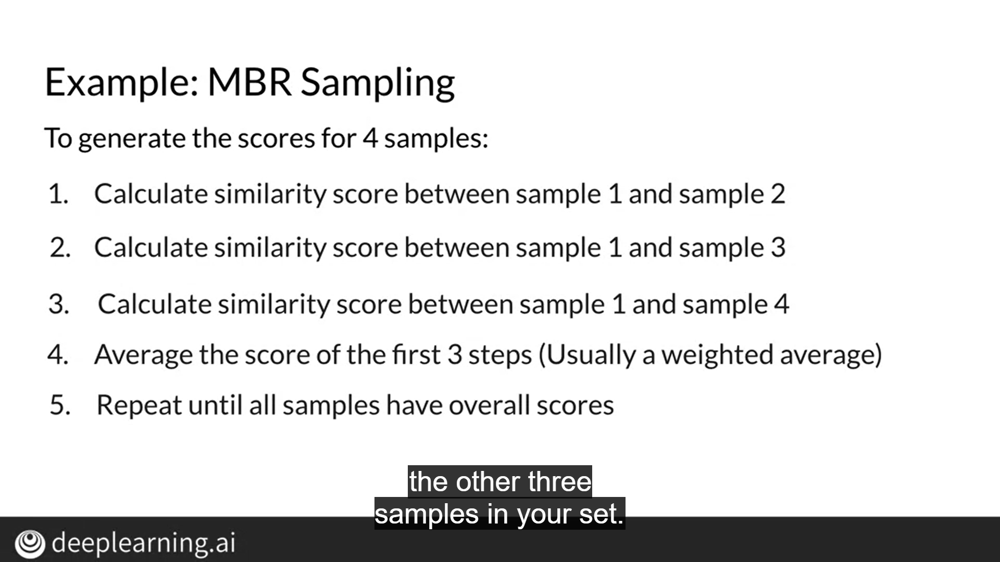

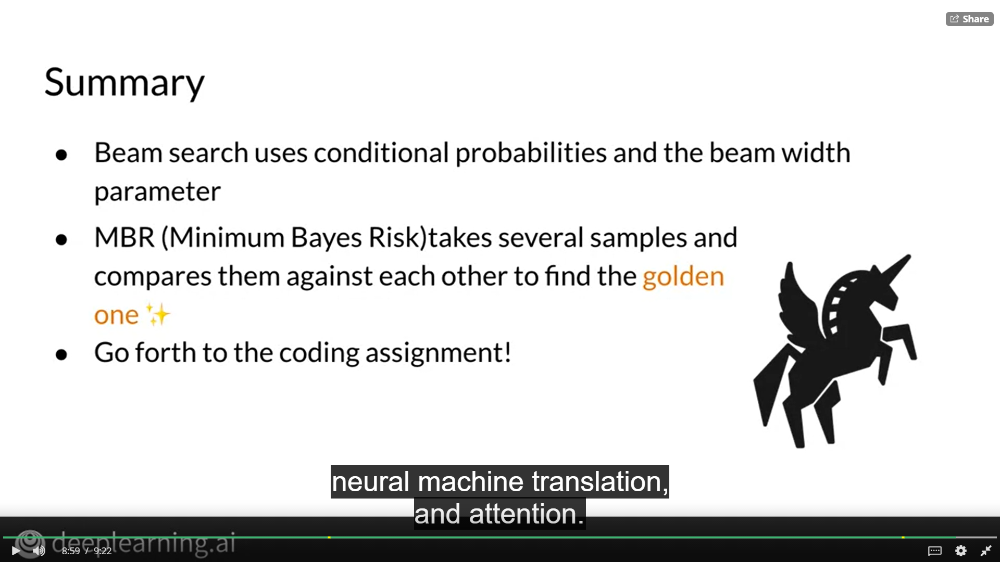